In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import glob
import os

In [ ]:
Image_dir = '/content/drive/My Drive/Colab Notebooks/CV Assignment 3'

In [ ]:
classes = sorted(os.listdir(Image_dir))
print(classes)

['Cycle', 'Mask', 'Motorcycle', 'Ronaldo.mp4']


In [ ]:
cyclepath = os.path.join(Image_dir,classes[0],'*.png')
maskpath = os.path.join(Image_dir,classes[1],'*.png')
motorcyclepath = os.path.join(Image_dir,classes[2],'*.png')

In [ ]:
cyclepath
maskpath
motorcyclepath

'/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Motorcycle/*.png'

In [ ]:
cycleimages = sorted(glob.glob(cyclepath))
maskimages = sorted(glob.glob(maskpath))
motorcycleimages = sorted(glob.glob(motorcyclepath))

In [ ]:
for fname in [cycleimages,maskimages,motorcycleimages]:
  print(fname)

['/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Cycle/im0.png', '/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Cycle/im1.png']
['/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Mask/im0.png', '/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Mask/im1.png']
['/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Motorcycle/im0.png', '/content/drive/My Drive/Colab Notebooks/CV Assignment 3/Motorcycle/im1.png']


In [ ]:
font = {'weight' : 'bold',
        'size'   : 25}
plt.rc('font', **font)

In [ ]:
calib_val = {'cycle' : [5299.313, 177.288],
             'motor' : [3979.911, 193.001],
             'mask'  : [4844.97, 170.458]
             }

In [ ]:
def plotImages(images):
  img = []
  fig = plt.figure(figsize=(40,60))
  label = ['Left','Right']
  for i, fname in enumerate(images):
    test = fig.add_subplot(1, len(images), i + 1)
    arr = cv2.imread(fname)
    test.imshow(cv2.cvtColor(arr, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    img.append(cv2.cvtColor(arr, cv2.COLOR_BGR2GRAY))
    test.set_title('{}_Image'.format(label[i]))
  fig.tight_layout()
  plt.show()

  return img


In [ ]:
def findDisparity(img,calib):
  stereoMatcher = cv2.StereoBM_create(numDisparities = 16, blockSize = 13)
  eps = 1e-6
  disparity = stereoMatcher.compute(img[0], img[1])
  print('Focal Length: {}, Baseline Distance: {} \n'.format(calib[0],calib[1]))
  depth = (calib[0] * calib[1]) / (disparity+eps)
  fig = plt.figure(figsize=(40,60))
  fig.add_subplot(1, 2, 1)
  plt.title('Disparity Map')
  plt.axis('off')
  plt.imshow(disparity,cmap='gray')
  fig.add_subplot(1, 2, 2)
  plt.title('Depth Map')
  plt.axis('off')
  plt.imshow(depth,cmap='gray')
  plt.show()
  print('Depth Map:', depth)


## CYCLE Images

In [ ]:
cycleimg = plotImages(cycleimages)

Focal Length: 5299.313, Baseline Distance: 177.288 



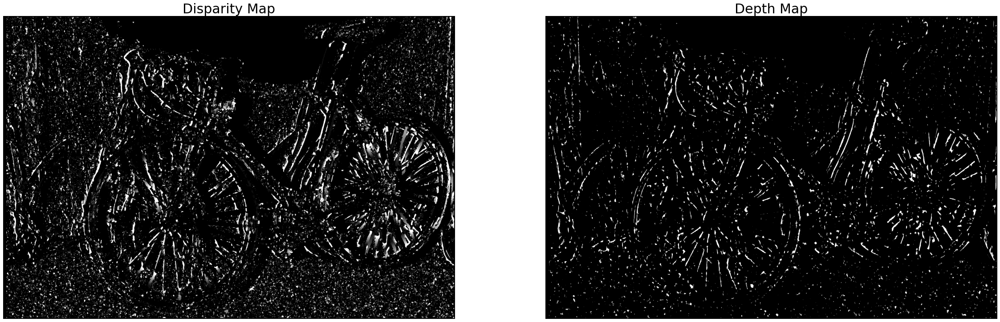

Depth Map: [[-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]
 [-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]
 [-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]
 ...
 [-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]
 [-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]
 [-58719.04136644 -58719.04136644 -58719.04136644 ... -58719.04136644
  -58719.04136644 -58719.04136644]]


In [ ]:
findDisparity(cycleimg,calib_val['cycle'])

Motorcycle Images

In [ ]:
mtrcycleimg = plotImages(motorcycleimages)

Focal Length: 3979.911, Baseline Distance: 193.001 



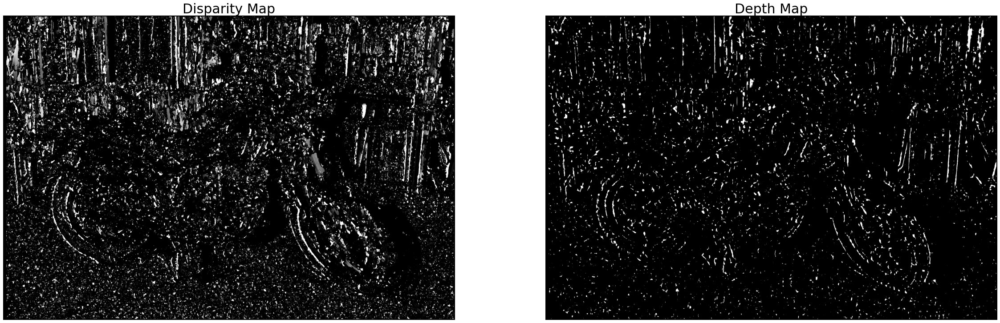

Depth Map: [[-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]
 [-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]
 [-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]
 ...
 [-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]
 [-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]
 [-48007.92818243 -48007.92818243 -48007.92818243 ... -48007.92818243
  -48007.92818243 -48007.92818243]]


In [ ]:
findDisparity(mtrcycleimg,calib_val['motor'])

Mask Images

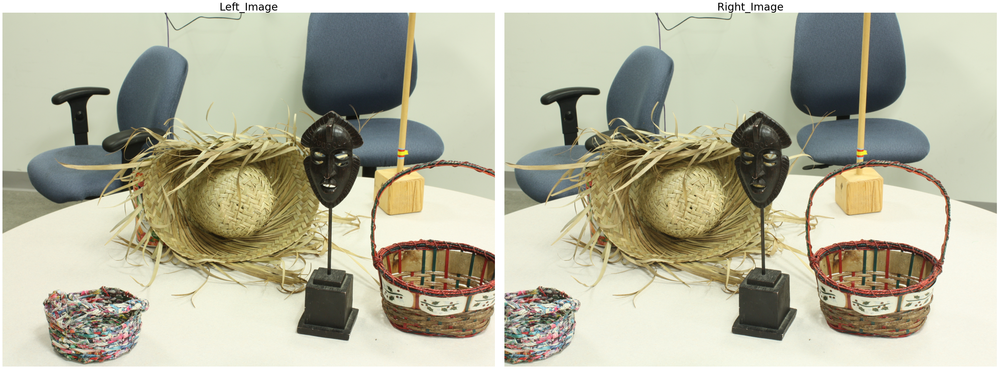

In [ ]:
maskimg = plotImages(maskimages)

Focal Length: 4844.97, Baseline Distance: 170.458 



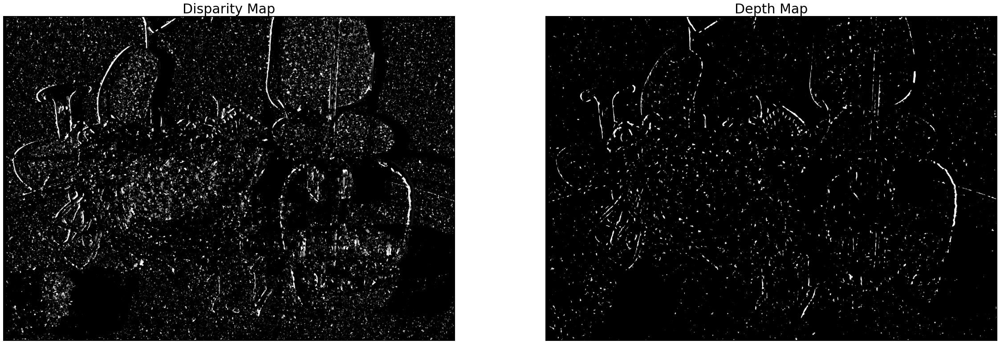

Depth Map: [[-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]
 [-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]
 [-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]
 ...
 [-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]
 [-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]
 [-51616.49674228 -51616.49674228 -51616.49674228 ... -51616.49674228
  -51616.49674228 -51616.49674228]]


In [ ]:
findDisparity(maskimg,calib_val['mask'])